In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import rcParams
import time
from copy import copy as dup
from scipy.integrate import odeint, solve_ivp, complex_ode

# import fourier as ft
# from sim_handling import Simulation

import diffusionstuff10 as ds

#for 3d plots
# from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
# from mpl_toolkits.mplot3d import Axes3D

# for animations
from matplotlib import animation
from IPython.display import HTML

In [2]:
# Graphics parameters
%matplotlib widget
ticklabelsize = 11
fontsize = 15
linewidth = 2

In [3]:
###Setting up the system

nx = 500 # Number of points in simulation box
xmax = 150
x = np.linspace(0, xmax, nx)
boxpoints = len(x)
deltax = x[1]-x[0]
Nbar = 1.0 # new Nbar from VMD, 260K
Nstar = .9/(2*np.pi)
nmid = int(nx/2)
xmid = max(x)/2
xmax = x[nx-1]
L = xmax/2

# Just conversions
nmpermonolayer = 0.3
umpersec_over_mlyperus = (nmpermonolayer/1e3*1e6)

# Diffusion coefficient
# D = 1.6e-4 # micrometers^2/microsecond
D = 0.002

# Diffusion coefficient scaled for this time step and space step
Doverdeltax2 = D/deltax**2

# Time steps
# dtmaxtimefactor = 50
dtmaxtimefactor = .5
dtmax = deltax**2/D
t_init = 0.0
# t_max = 50000
# t_max = dtmax/dtmaxtimefactor
deltat = 5#2000#dtmax/dtmaxtimefactor
tspan = [t_init, t_init+deltat]

# Deposition rate
nu_kin = 250 # microns/second - about right for 260 K
nu_kin_mlyperus = nu_kin/umpersec_over_mlyperus # monolayers per microsecond

# Supersaturation
sigma0 = 0.19
sigmaIcorner = 0.21 # Must be bigger than sigma0 to get growth
center_reduction = 0.25 # In percent
c_r = center_reduction/100

# Overlying supersaturation
# sigmaI = ds.getsigmaI(x,xmax,center_reduction,sigmaIcorner,method='sinusoid')
sigmaI = ds.getsigmaI(x,xmax,center_reduction,sigmaIcorner,method='parabolic')

odemethod = 'BDF'
# odemethod = 'RK45'

# Reporting
print("D =", D, 'um^2/us',D * 1e-12*1e6*1e9, 'x 10^-9 m^2/sec')
print('deltat_max (Diffusion time) =', dtmax)
print('deltat =', deltat)
print('nu_kin_mlyperus =', nu_kin_mlyperus, 'monolayers/us')
print('nmid =', nmid)
print('N* =', Nstar)
print('N*x2pi =', Nstar*2*np.pi)
print('Nbar, Nbar-N*, N*/Nbar =', Nbar, Nbar-Nstar, Nstar/Nbar)
print('deltax =', deltax)
print('sigma_0 =', sigma0)
print('sigmaIcorner =', sigmaIcorner)
print('center reduction =', center_reduction, '%')
print('c_r =', c_r, 'dimensionless')
print('max growth rate =', nu_kin_mlyperus*sigmaIcorner*umpersec_over_mlyperus, 'um/sec')
print('min growth rate =', nu_kin_mlyperus*(sigmaIcorner-sigma0)*umpersec_over_mlyperus, 'um/sec')
print('nu_kin =', nu_kin, 'um/sec')
print('dx =', deltax)
print('L =', L, 'micrometers')

D = 0.002 um^2/us 2.0 x 10^-9 m^2/sec
deltat_max (Diffusion time) = 45.18054144360867
deltat = 5
nu_kin_mlyperus = 0.8333333333333334 monolayers/us
nmid = 250
N* = 0.1432394487827058
N*x2pi = 0.9
Nbar, Nbar-N*, N*/Nbar = 1.0 0.8567605512172942 0.1432394487827058
deltax = 0.30060120240480964
sigma_0 = 0.19
sigmaIcorner = 0.21
center reduction = 0.25 %
c_r = 0.0025 dimensionless
max growth rate = 52.5 um/sec
min growth rate = 4.999999999999998 um/sec
nu_kin = 250 um/sec
dx = 0.30060120240480964
L = 75.0 micrometers


In [4]:
uselayers = True

# 1D run parameters
if uselayers:
    layermax = 1000
    # layermax=500
else:
    countermax = 15000

In [5]:
### initial conditions and parameters, NOTE: f1d nx is replaced by 2*N-2 for easier comparisons with ft soln

# N = int(nx/2 + 1)
N = 65


if N > (nx/2 + 1):
    print("bad choice")

xf = np.linspace(x[0],xmax,2*N-2)
xfmid = max(xf)/2

Ntot_init = np.ones(2*N-2)
Nqll_init = ds.getNQLL(Ntot_init,Nstar,Nbar)

sigmaIft = ds.getsigmaI(xf,xmax,center_reduction,sigmaIcorner,method='parabolic')

# Ntot_init_1D = np.ones(nx)
# NQLL_init_1D = ds.getNQLL(Ntot_init_1D,Nstar,Nbar)

tintervals = np.linspace(tspan[0],tspan[-1],nx)

# paramsarr = [Nbar, Nstar, sigmaI, sigma0, nu_kin_mlyperus, Doverdeltax2, nx] 
# paramsarr = [Nbar, Nstar, sigmaIft, sigma0, nu_kin_mlyperus, Doverdeltax2, nx] 

In [6]:
print("Starting a system")

### easier to deal with dictionaries I think...
params = {"N" : N,
          "Nstar" : Nstar,
          "nu_kin" : nu_kin,
          "nu_kin_mlyperus" : nu_kin_mlyperus,
          "Nbar" : Nbar,
          "sigma0" : sigma0,
          "sigmaI" : sigmaIft,
          "k" : np.arange(0,N),
          "D" : D/N,
          "Doverdeltax2" : Doverdeltax2,
          "nx" : nx,
          "ICNT" : Ntot_init,
        #   "ICNQ" : Nqll_init,
          "tinterval":tintervals}

Starting a system


In [7]:
### original(1var_tot) solution

# Call the ODE solver
# ylast = np.array(Ntot_init_1D)
ylast = np.array(Ntot_init)

counter = 0
layer = 0
ttot = 0.0

def f1d_rhs(t,y):
    return ds.f1d_solve_ivp_1var(t,y,params)

# Integrate up to next time step
sol = solve_ivp(fun=f1d_rhs, t_span=[tintervals[0],tintervals[-1]], y0=ylast, t_eval=tintervals, rtol=1e-12, method=odemethod)
ykeep_1D = sol.y
tkeep_1D = sol.t

In [8]:
### storing originalish soln

ykeep_1D = np.array(ykeep_1D, np.float64)

Ntot = ykeep_1D
NQLL = ds.getNQLL(Ntot,Nstar,Nbar)

tkeep_1Darr = np.array(tkeep_1D, np.float64)

[[1.         0.99920838 0.99841302 ... 1.07330183 1.07367553 1.07404707]
 [1.         0.9992085  0.99841325 ... 1.07327863 1.07365237 1.07402396]
 [1.         0.99920861 0.99841347 ... 1.0732558  1.07362958 1.07400121]
 ...
 [1.         0.99920861 0.99841347 ... 1.0732558  1.07362958 1.07400121]
 [1.         0.9992085  0.99841325 ... 1.07327863 1.07365237 1.07402396]
 [1.         0.99920838 0.99841302 ... 1.07330183 1.07367553 1.07404707]]


In [9]:
### sim with 1var_qll

ylast_qll = np.array(Nqll_init)

def f1dqll_rhs(t,y):
    return ds.f1d_solve_ivp_1var_QLL(t,y,params)

# Integrate up to next time step
sol_qll = solve_ivp(fun=f1dqll_rhs, t_span=[tintervals[0],tintervals[-1]], y0=ylast_qll, t_eval=tintervals, rtol=1e-12, method=odemethod)
ykeep_1D_qll = sol_qll.y
tkeep_1D_qll = sol_qll.t

c:\Users\elsla\IceResearch\icecontinuum\eslattery\diffusionstuff10.py:348: RuntimeWarning: overflow encountered in square
  dNqll = 2*np.pi*nu_kin_mlyperus*sigma_m * (np.sqrt(Nstar**2 - (Nbar - Nqll0)**2))##Nstar*(np.cos(np.arcsin((Nbar - Nqll0)/Nstar))) ##THIS IS WRONG FIX IT
c:\Users\elsla\IceResearch\icecontinuum\eslattery\diffusionstuff10.py:348: RuntimeWarning: invalid value encountered in sqrt
  dNqll = 2*np.pi*nu_kin_mlyperus*sigma_m * (np.sqrt(Nstar**2 - (Nbar - Nqll0)**2))##Nstar*(np.cos(np.arcsin((Nbar - Nqll0)/Nstar))) ##THIS IS WRONG FIX IT


KeyboardInterrupt: 

In [ ]:
### storing 1var_qll soln

ykeep_1D_qll = np.array(ykeep_1D_qll, np.float64)

NQLL_qll = ykeep_1D_qll
Ntot_qll = 1/(2*np.pi) * np.arcsin((Nbar - NQLL_qll)/Nstar)

tkeep_1Darri = np.array(tkeep_1D_qll, np.float64)

In [ ]:
### experimenting w ft, in terms of nqll

import sys
import scipy as sp

def fftnorm(u_full):
    """Computes normalized FFT (such that FFT and IFFT are symmetrically normalized)
    
    Parameters
    ----------
    u_full : 1D Numpy Array (N,)
        The vector whose discrete FFT is to be computed

    Returns
    -------
    normalizedFFT : 1D Numpy Array (N,)
        The transformed version of that vector
    """

    normalizedFFT = np.fft.rfft(u_full,norm = "forward")
    return normalizedFFT

def ifftnorm(u_full):
    """Computes normalized IFFT (such that FFT and IFFT are symmetrically normalized)
    
    Parameters
    ----------
    u_full : 1D Numpy Array (N,)
        The vector whose discrete IFFT is to be computed

    Returns
    -------
    normalizedIFFT : 1D Numpy Array (N,)
        The transformed version of that vector
    """
    

    normalizedIFFT = np.fft.irfft(u_full, norm = "forward")
    return normalizedIFFT


def nQLLRHS(nQLLk,sigMk,params):
    """Computes RHS of Nqll in k space

    Parameters
    ----------
    nQLLk : 1D Numpy array (N,)
            Thickness of quasiliquid water layer, in k space
    sigMk : 1D Numpy array (N,)
            Sigma M, in k space
    params : Dictionary
             Dictionary of relevant parameters (see below)
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond
        k : 1D Numpy array (N,), array of available wavenumbers
        D : float, diffusion coefficient
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot)        
    
    Returns
    -------
    dnQLL : 1D Numpy array (N,)
        Array containing derivative of nQLL wrt t, in k space
    """

    D = params['D']
    nu_kin_mlyperus = params['nu_kin_mlyperus']
    Nstar = params['Nstar']
    Nbar = params['Nbar']
    k = params['k']

    Nqll = ifftnorm(nQLLk)
    convReal = ifftnorm(sigMk) * (np.sqrt(Nstar**2 - (Nbar - Nqll)**2))##np.cos(np.arcsin((Nbar - Nqll)/Nstar))##(np.cos(np.arcsin((Nbar - ifftnorm(nQLLk))/Nstar)))) * Nstar
    
    n = int(len(Nqll)/2)
    for i in range (1,n-1):
        if Nqll[i-1] - Nqll[i] > 0.0000000001:
            convReal[i] = -convReal[i]
    for i in range (n+1,2*n-1):
        if Nqll[i] - Nqll[i+1] < -0.0000000001:
            convReal[i] = -convReal[i]
    # Correct center points to follow surrounding points
    for i in range (n-1, n+1):
        if convReal[i-1] <= 0 and convReal[i+3] <= 0:
            convReal[i] = -convReal[i]
    # Correct endpoints to follow leading points
    # Index 0
    if Nqll[2] - Nqll[1] > 0 and Nqll[0] > Nqll[1]: #increasing slope, initial point is bigger than next
        convReal[0] = -convReal[0]
    if Nqll[2] - Nqll[1] < 0: #decreasing slope BUT WHAT ELSE?
        convReal[0] = -convReal[0]
    # Index -1
    if Nqll[-3] - Nqll[-2] > 0 and Nqll[-1] > Nqll[-2]: #decreasing slope, final point is bigger than last
        convReal[-1] = -convReal[-1]
    if Nqll[-3] - Nqll[-2] < 0:# and Nqll[-1] < abs(Nqll[-2]): #increasing slope AND WHAT ELSE???
        convReal[-1] = -convReal[-1]    
        
    # Add to transformed diffusion
    dnQLL = - k**2 * D*nQLLk + 2*np.pi*nu_kin_mlyperus * fftnorm(convReal)
    ###
    # tester(dnQLL,Nqll,params) # tester function to determine error as sim progresses
    ###
    return dnQLL
    
# def tester(dnQ,Nq,params):
#     dNq = ds.f1d_solve_ivp_1var_QLL(0,Nq,params)
#     print('dnQ - dNq : ',ifftnorm(dnQ) - dNq)

def RHS(t,n,params):
    """Computes the RHS for the 1 variable system. For use in solver.
    
    Parameters
    ----------
    t : float
        Current time, for use in solver
    n : Numpy array (N,)
        Current state vector of positive modes (only total)   
    params : Dictionary
             Dictionary of relevant parameters (see below)
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot)

    Returns
    -------
    RHS : 1D Numpy array (N,)
          Derivative of each positive mode in state vector
    """
    
    # find NQLL in real space
    nQLL = n
    Nqll = ifftnorm(nQLL)
    
    # calc sigma M and transform
    sigmaM = ds.getsigmaM(Nqll,params)
    sigMk = fftnorm(sigmaM)
    
    # calc dnQLL/dt in k space and return as array
    dnQ = nQLLRHS(nQLL,sigMk,params)

    RHS = np.array(dnQ)
    return RHS


def runSim(params):
    """Runs a simulation of the ice continuum in Fourier space
    
    Parameters
    ----------
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond
        sigma0 : 
        sigmaI : 
        k : 1D Numpy array (N,), array of available wavenumbers
        D : float, diffusion coefficient
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot)
        tinterval : 1D Numpy array (N,), timesteps for solver
        ICNT : 1D Numpy array (N,), initial total thickness of qll and ice layers
        
    Returns
    -------
    uSim : ODE solver output
           Output solution from sp.integrate.solve_ivp (includes state vector at all timesteps, time vector, etc.)
    """
    
    # unpack parameters from dictionary
    N = params['N']
    ICNT = params['ICNT']
    tinterval = params['tinterval']
    Nstar = params['Nstar']
    Nbar = params['Nbar']
    
    nQLLIC = fftnorm(ds.getNQLL(ICNT,Nstar,Nbar))[:N]
    n = np.array(nQLLIC)
    
    # define RHS in form appropriate for solve_ivp
    def myRHS(t,y):
        out = RHS(t,y,params)
        return out

    # Call the ODE solver
    solv = solve_ivp(fun=myRHS, t_span=[tinterval[0],tinterval[-1]], y0=n, t_eval = tinterval, rtol=1e-12, method=odemethod)
    ykeep_ft = solv.y
    tkeep_ft = solv.t
    return [ykeep_ft,tkeep_ft]


def makeReal(fourierSol,params): 
    """Transforms the solution to the PDE back into real x space

    Parameters
    ----------
    fourierSol : 2D Numpy array (2,N)
        Array containing y solutions to RHS at position 0 and timesteps at position 1
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond (unused explicitly here)
        sigma0 : (unused explicitly here)
        sigmaI : (unused explicitly here)
        k : 1D Numpy array (N,), array of available wavenumbers (unused explicitly here)
        D : float, diffusion coefficient (unused explicitly here)
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot) (unused explicity here)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot) (unused explicitly here)
        tinterval : 1D Numpy array (N,), timesteps for solver (unused explicitly here)
        ICNT : 1D Numpy array (N,), initial total thickness of qll and ice layers (unused explicitly here)
    
    Returns
    -------
    Nqll : 2D Numpy array (somesize)
        Array containing thickness of the quasiliquid layer, in real xt space
    """

    N = params['N']
    # print(N)
    timesteps = fourierSol.shape[1]
    # print(fourierSol.shape[1])
    # NTot = np.zeros((timesteps,2*N-2))
    Nqll = np.zeros((timesteps,2*N-2))
    # print(ifftnorm(fourierSol[:,0]).shape)
    for i in range(timesteps):
        # NTot[i,:] = ifftnorm(fourierSol[:,i])
        Nqll[i,:] = ifftnorm(fourierSol[:,i])
        
    return Nqll
# def makeReal(fourierSol,params):
#     N = params['N']
#     print('from makeReal, N: ',N)
#     timesteps = fourierSol.shape[1]
#     print('timesteps: ', timesteps)
#     Nqll = np.zeros((timesteps,2*N-2))

#     for i in range(timesteps):
#         Nqll[i,:] = ifftnorm(fourierSol[:,i])
        
#     return Nqll

In [ ]:
### testing runsim 

Ntinit = params['ICNT']
Nstar = params['Nstar']
Nbar = params['Nbar']
tinterval = params['tinterval']

Nqll = ds.getNQLL(Ntinit,Nstar,Nbar)
nqll = fftnorm(Nqll)

def rhs(t,y):
    return RHS(t,y,params)

solv = solve_ivp(fun=rhs, t_span=[tinterval[0],tinterval[-1]], y0=nqll, t_eval=tinterval, method=odemethod)
ykeepft = solv.y
tkeepft = solv.t

print(ykeepft)
ksoln = np.array([ykeepft,tkeepft])
rsoln = makeReal(ksoln[0],params)

In [ ]:
tkeep_ftarr = np.array(ksoln[1],np.float64)#np.array(soln[1], np.float64)

Nqllkeep_ft = rsoln#realSoln[:]
# Ntotkeep_ft = 1/(2*np.pi) * np.arcsin((Nbar - Nqllkeep_ft)/Nstar)
# Nicekeep_ft = Ntotkeep_ft-Nqllkeep_ft

# print(Nqllkeep_ft)

[0.8567674  0.85676712 0.85676684 0.85676658 0.85676633 0.85676609
 0.85676585 0.85676563 0.85676541 0.85676521 0.85676501 0.85676482
 0.85676463 0.85676446 0.85676429 0.85676412 0.85676397 0.85676382
 0.85676368 0.85676354 0.85676341 0.85676329 0.85676317 0.85676306
 0.85676295 0.85676284 0.85676275 0.85676265 0.85676256 0.85676248
 0.8567624  0.85676232 0.85676225 0.85676218 0.85676211 0.85676205
 0.85676199 0.85676194 0.85676188 0.85676183 0.85676179 0.85676174
 0.8567617  0.85676166 0.85676163 0.85676159 0.85676156 0.85676153
 0.85676151 0.85676148 0.85676146 0.85676144 0.85676142 0.8567614
 0.85676138 0.85676137 0.85676136 0.85676135 0.85676134 0.85676133
 0.85676132 0.85676132 0.85676132 0.85676131 0.85676131 0.85676132
 0.85676132 0.85676132 0.85676133 0.85676134 0.85676135 0.85676136
 0.85676137 0.85676138 0.8567614  0.85676142 0.85676144 0.85676146
 0.85676148 0.85676151 0.85676153 0.85676156 0.85676159 0.85676163
 0.85676166 0.8567617  0.85676174 0.85676179 0.85676183 0.85676

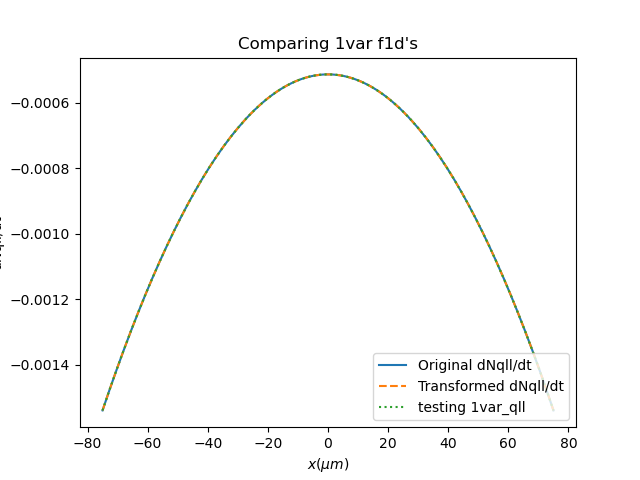

In [ ]:
# ### testing individual rhs derivative, 1var ntot or nqll

# plt.close()

# # der = RHS(0,fftnorm(Nqll_init),params)
# # print(ifftnorm(der))

# # a = 130
# a = 92
# # a = 150
# # a = 100

# # print((fftnorm(NQLL[:,a])))
# derf = ifftnorm(RHS(0,fftnorm(NQLL[:,a]),params))
# der = np.array(ds.f1d_solve_ivp_1var_QLL(0,NQLL[:,a],params))
# oridntt = np.array(ds.f1d_solve_ivp_1var(0,Ntot[:,a],params))
# oridnqq = Nstar * 2*np.pi * oridntt * np.cos(2*np.pi*Ntot[:,a])
# # oridntt = np.array(ds.f1d_solve_ivp_1var(0,Ntot_init,paramsarr))
# # oridnqq =  Nstar * 2*np.pi * oridntt * np.cos(2*np.pi*Ntot_init)

# # print(der[0],der[-1])
# # print(oridnqq[0],oridnqq[-1])

# plt.figure()
# # plt.scatter([xf[0],xf[-1]]-xmid,[der[0],-der[-1]],color='red')
# plt.plot(xf-xfmid,oridnqq,label='Original dNqll/dt')
# plt.plot(xf-xfmid,derf,label='Transformed dNqll/dt',linestyle='--')
# plt.plot(xf-xfmid,der,label='testing 1var_qll',linestyle=':')
# # plt.plot(xf-xfmid,(derf-oridnqq)/oridnqq,label='ft - original %',linestyle='--')
# # plt.plot(xf-xfmid,(der-oridnqq)/oridnqq,label='1var_qll - original %')
# # plt.plot(np.linspace(xf[0],xf[-1],N),fftnorm(NQLL[:,a]))
# # plt.plot(xf-xfmid,NQLL[:,a]-1+0.08)
# print(NQLL[:,a])
# plt.title('Comparing 1var f1d\'s')
# plt.xlabel('$x (\mu m)$')
# plt.ylabel('dNqll/dt')
# # plt.grid(True)
# # plt.ylim(-0.088938,0.088905)
# # print(ifftnorm(der))
# plt.legend(loc='lower right')

In [ ]:
# soln = runSim(params)
# # print(soln)
# # # print('here')
# realSoln = makeReal(soln[0],params)

In [ ]:
# plt.figure()
# nk,nt = np.shape(soln[0])
# for i in range(nt):
#     plt.plot(np.arange(0,N),soln[0][:,i].real,label=str(tintervals[i]))
# plt.xlabel('k')
# plt.ylabel('real part of solution')
# plt.grid(True)
# plt.legend()

In [ ]:
# plt.figure()
# nk,nt = np.shape(soln[0])
# for i in range(nt):
#     plt.plot(np.arange(0,N),soln[0][:,i].imag,label=str(tintervals[i]))
# plt.grid(True)
# plt.xlabel('k')
# plt.ylabel('imaginary part of solution')
# plt.legend()

In [ ]:
# ## animation of original 1var dnqdt and transformed 1var dnqdt
# p = 0

# myFig = plt.figure()
# ax = plt.subplot()
# # ax.axis(xmin = x[0] - xmid,xmax = x[-1] - xmid,ymin = -0.02, ymax = 0.02)
# # ax.axis(xmin = x[0] - xmid,xmax = x[-1] - xmid,ymin = -0.000002, ymax = 0.000002)

# # create initial frames
# lineList = [ax.plot([],[]) for i in range (4)]
# # lineList[0] = ax.plot(x - xmid,np.zeros(len(x)),linestyle='--',label='testing dnq/dt',color='red')
# # lineList[1] = ax.plot(x - xmid,np.zeros(len(x)),label='dnq/dt')
# ax.set_xlabel('x')
# ax.set_ylabel('difference between dnq/dt\'s')
# # define function to draw each frame
# def makeFrame(n):
#     ax.set_title('dnq/dt to nqll, n = ' + str(n))

#     testdnq = ifftnorm(RHS(0,fftnorm(NQLL[:,n]),params))
#     testdnqi = ds.f1d_solve_ivp_1var_QLL(0,NQLL[:,n],params)
#     oridnt = np.array(ds.f1d_solve_ivp_1var(0,Ntot[:,n],params))
#     oridnq =  Nstar * 2*np.pi * oridnt * np.cos(2*np.pi*Ntot[:,n])
#     # lineList[0][0].set_data(xf - xmid,testdnq)
#     # lineList[0][0].set_linestyle('--')
#     # lineList[0][0].set_label('testing dnq/dt')

#     # lineList[1][0].set_data(xf - xmid,oridnq)
#     # lineList[1][0].set_label('dnq/dt')
#     # lineList[2][0].set_label('t = ' + str(tintervals[n]))
#     # lineList[3][0].set_label('n = ' + str(n))

#     # lineList[0][0].set_data(xf - xmid,testdnq - oridnq)
#     lineList[1][0].set_data(xf-xfmid,(testdnqi - oridnq)/oridnq)
#     lineList[0][0].set_data(xf - xmid,(testdnq - oridnq)/oridnq)

#     ax.legend()
#     return lineList

# lineList[0][0].set_label('transform dnq/dt - original %')
# lineList[0][0].set_linestyle('--')
# lineList[1][0].set_label('1var_qll dnq/dt - original %')
# lineList[1][0].set_linestyle('-.')


# # generate animations
# anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_1D))
# plt.close()
# HTML(anim1.to_jshtml())

In [ ]:
colorIce = 'k'
colorTot = 'b'
colorSteps = 'cyan'
colorT = 'red'

a = -1
# print(np.shape(Nqllkeep_ft[a,:]))
# print(NQLL[:,a])

plt.figure()
plt.title('nx = ' + str(nx) + ', tsteps = ' + str(len(tintervals)) + ', NQLLs')
# plt.plot(xf-xfmid, NQLL[:,a], label='qll, 1var_tot')
# # plt.plot(x-xmid, Nice[:,a], color=colorIce, label='ice', lw=linewidth,linestyle='-')
# # plt.plot(x-xmid, Ntot[:,a], color=colorTot, label='ice+liquid', lw=linewidth,linestyle='-')
plt.plot(xf-xfmid,NQLL_qll[:,a], label='qll, 1var_qll',linestyle='--')
plt.plot(xf-xfmid,Nqllkeep_ft[a,:], label='qll transformed',linestyle=':')
# # plt.plot(xf-xfmid, Nicekeep_ft[a], color=colorT, label='ice transformed', linestyle='--')
# # plt.plot(xf-xfmid, Ntotkeep_ft[a], color='purple', label='ice+liquid transformed', linestyle='--')

# plt.plot(xf-xfmid,(NQLLi[:,a]-NQLL[:,a])/NQLL[:,a],label='1var_qll comparison')
# plt.plot(xf-xfmid,(Nqllkeep_ft[a,:]-NQLL[:,a])/NQLL[:,a],label='transform comparison')
# plt.plot(xf-xfmid,(Nqllkeep_ft[a,:]-NQLLi[:,a])/NQLLi[:,a],label='1var_qll and transform comparison')

plt.xlabel(r'$x (\mu m$)',fontsize=fontsize)
plt.ylabel(r'$liquid \ layers$',fontsize=fontsize)
# plt.xlim([-xmid, xmid])
# plt.ylim([0,550])
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
plt.legend()
plt.grid('on')

In [ ]:
# testy = Ntot[:,-1]
# testn = fftnorm(testy)[:N]

# rhstest = RHS(tintervals[-1],testn,params)
# rhsreals = ifftnorm(rhstest)
# f1degTOT = ds.f1d_solve_ivp_1var(tintervals[-1],testy,paramsarr)

# plt.figure()
# # plt.plot(x-xmid,f1deg-rhsreals,label='f1d')
# plt.plot(xf-xfmid,rhsreals,label='rhs',linestyle='--')
# plt.legend()

In [ ]:
# ## animation of ntot original and transformed solution

# myFig = plt.figure()
# ax = plt.subplot()
# ax.set_title('Ntot')
# ax.axis(xmin = xf[0]-xmid,xmax = xf[-1]-xmid)#,ymin = -1, ymax = 5)
# # create initial frames
# lineList = [ax.plot([],[]) for i in range (2)]
# lineList[0] = ax.plot(xf - xmid,Ntotkeep_ft[0,:],linestyle='--',label='transformed Ntot',color='red')
# lineList[1] = ax.plot(x-xmid,Ntot[:,0],label='original Ntot',color='blue')
# # define function to draw each frame
# def makeFrame(n):
#     lineList[0][0].set_data(xf - xmid,Ntotkeep_ft[n])
#     lineList[1][0].set_data(x-xmid, Ntot[:,n])
#     return lineList
# ax.legend()

# # generate animations
# anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_ftarr))

# plt.close()
# HTML(anim1.to_jshtml())

In [ ]:
# ## animation of nqll original

# myFig = plt.figure()
# ax = plt.subplot()
# ax.set_title('NQLL')
# # ax.axis(xmin = x[0]-xmid,xmax = x[-1]-xmid,ymin = 0.8, ymax = 1.1)
# # create initial frames
# lineList = [ax.plot([],[]) for i in range (3)]
# # lineList[0] = ax.plot(x - xmid,NQLL[:,0],linestyle='--',label='transformed Ntot',color='red')

# # define function to draw each frame
# def makeFrame(n):
#     lineList[0][0].set_data(xf - xfmid,NQLL_qll[:,n])
#     lineList[0][0].set_label('original NQLL')

#     lineList[1][0].set_data(xf - xfmid,Nqllkeep_ft[n,:])
#     lineList[1][0].set_label('transform')
#     lineList[1][0].set_linestyle('--')

#     # lineList[0][0].set_data(xf-xfmid, (Nqllkeep_ft[n,:]-NQLL_qll[:,n])/(NQLL_qll[:,n]))
#     ax.legend()

#     return lineList

# # generate animations
# anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_1D))

# plt.close()
# HTML(anim1.to_jshtml())